It is highly recommended to use a powerful **GPU**, you can use it for free uploading this notebook to [Google Colab](https://colab.research.google.com/notebooks/intro.ipynb).
<table align="center">
 <td align="center"><a target="_blank" href="https://colab.research.google.com/github/ezponda/intro_deep_learning_solutions/blob/main/class/CNN/Classical_Architectures_CNN.ipynb">
        <img src="https://i.ibb.co/2P3SLwK/colab.png"  style="padding-bottom:5px;" />Run in Google Colab</a></td>
  <td align="center"><a target="_blank" href="https://github.com/ezponda/intro_deep_learning_solutions/blob/main/class/CNN/Classical_Architectures_CNN.ipynb">
        <img src="https://i.ibb.co/xfJbPmL/github.png"  height="70px" style="padding-bottom:5px;"  />View Source on GitHub</a></td>
</table>

**Classic network architectures:**

- LeNet-5
- AlexNet
- VGG 16

**Modern network architectures:**

- Inception
- ResNet
- ResNeXt
- DenseNet



# AlexNet

AlexNet is the name of CNN, designed by  [Alex Krizhevsky](https://www.cs.toronto.edu/~kriz/) . AlexNet is considered one of the most influential papers published in computer vision, as of 2020, the paper has been cited over 70,000 times according to Google Scholar.

AlexNet competed in the [ImageNet](https://en.wikipedia.org/wiki/ImageNet) Large Scale Visual Recognition Challenge (1000 different classes) on September 30, 2012. The network achieved a top-5 error of 15.3%, more than 10.8 percentage points lower than that of the runner up.

AlexNet consists of 5 Convolutional Layers and 3 Fully Connected Layers.


<img src="https://i.ibb.co/CBp6sfy/Alex-Net-architecture.png" alt="Alex-Net-architecture" border="0" />

In [1]:
img_shape = (227, 227, 3)
n_classes = 1000

In [2]:
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
import numpy as np

alexnet = tf.keras.Sequential()

# Layer 1
alexnet.add(Conv2D(filters=96, kernel_size=(11, 11), input_shape=img_shape))
alexnet.add(BatchNormalization())
alexnet.add(Activation('relu'))
alexnet.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Layer 2
alexnet.add(Conv2D(filters=256, kernel_size=(5, 5)))
alexnet.add(BatchNormalization())
alexnet.add(Activation('relu'))
alexnet.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Layer 3
alexnet.add(Conv2D(filters=384, kernel_size=(3, 3)))
alexnet.add(BatchNormalization())
alexnet.add(Activation('relu'))
alexnet.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# Layer 4
alexnet.add(Conv2D(filters=384, kernel_size=(3, 3)))
alexnet.add(BatchNormalization())
alexnet.add(Activation('relu'))

# Layer 5
alexnet.add(Conv2D(filters=256, kernel_size=(3, 3)))
alexnet.add(BatchNormalization())
alexnet.add(Activation('relu'))
alexnet.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

## Fully-connected
# Layer 6
alexnet.add(Flatten())
alexnet.add(Dense(4096, activation='relu'))
alexnet.add(Dropout(0.5))

# Layer 7
alexnet.add(Dense(4096, activation='relu'))
alexnet.add(Dropout(0.5))

# Layer 8
alexnet.add(Dense(n_classes, activation='softmax'))

alexnet.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 217, 217, 96)      34944     
_________________________________________________________________
batch_normalization (BatchNo (None, 217, 217, 96)      384       
_________________________________________________________________
activation (Activation)      (None, 217, 217, 96)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 108, 108, 96)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 104, 104, 256)     614656    
_________________________________________________________________
batch_normalization_1 (Batch (None, 104, 104, 256)     1024      
_________________________________________________________________
activation_1 (Activation)    (None, 104, 104, 256)     0

In [3]:
from tensorflow.keras.utils import plot_model
plot_model(alexnet, show_shapes=True)

('Failed to import pydot. You must `pip install pydot` and install graphviz (https://graphviz.gitlab.io/download/), ', 'for `pydotprint` to work.')


In [4]:
def show_loss_accuracy_evolution(history):

    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Sparse Categorical Crossentropy')
    ax1.plot(hist['epoch'], hist['loss'], label='Train Error')
    ax1.plot(hist['epoch'], hist['val_loss'], label='Val Error')
    ax1.grid()
    ax1.legend()

    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.plot(hist['epoch'], hist['accuracy'], label='Train Accuracy')
    ax2.plot(hist['epoch'], hist['val_accuracy'], label='Val Accuracy')
    ax2.grid()
    ax2.legend()

    plt.show()

# LeNet-5

LeNet-5 is a classical CNN that was introduced back to 1998, is designed to recognize the digits from 0 to 9. 

LeNet-5 is such a classical model that it consists of two convolution layers followed by average pooling layers for each and apply three fully connected layers in the end of the network. In the original paper **sigmoid** activation function was used.

<img src="https://i.ibb.co/y4KJH39/LeNet-5.png" alt="LeNet-5" border="0">

x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples


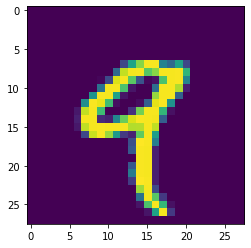

In [5]:
import matplotlib.pyplot as plt
%matplotlib inline

# Model / data parameters
num_classes = 10
img_shape = (28, 28, 1)

# load data, split between train and test sets
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.mnist.load_data()

# Scale images to the [0, 1] range
x_train = train_images.astype("float32") / 255
x_test = test_images.astype("float32") / 255

# Make sure images have shape (28, 28, 1)
x_train = np.expand_dims(x_train, -1)
x_test = np.expand_dims(x_test, -1)
print("x_train shape:", x_train.shape)
print(x_train.shape[0], "train samples")
print(x_test.shape[0], "test samples")


# convert class vectors to binary class matrices
y_train = tf.keras.utils.to_categorical(train_labels, num_classes)
y_test = tf.keras.utils.to_categorical(test_labels, num_classes)

plt.imshow(train_images[4])
plt.show()

### Create the model

Model original architecture:

- **First conv layer**: 6 filters of 3x3, sigmoid activation + Average Pooling
- **Second conv layer**: 16 filters of 3x3, sigmoid activation + Average Pooling
- **Flatten layer**
- **Dense layer**: 120 units, sigmoid activation
- **Dense layer**: 84 units, sigmoid activation
- **Output layer**: 10 units (classes), softmax activation

In [6]:
## sigmoids and layers.AveragePooling2D
from tensorflow.keras import layers

from tensorflow.keras import layers

model_old = keras.Sequential()

model_old.add(layers.Conv2D(filters=6, kernel_size=(3, 3), activation='sigmoid', input_shape=img_shape))
model_old.add(layers.AveragePooling2D())

model_old.add(layers.Conv2D(filters=16, kernel_size=(3, 3), activation='sigmoid'))
model_old.add(layers.AveragePooling2D())

model_old.add(layers.Flatten())

model_old.add(layers.Dense(units=120, activation='sigmoid'))

model_old.add(layers.Dense(units=84, activation='sigmoid'))

model_old.add(layers.Dense(units=10, activation = 'softmax'))

model_old.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
history = model_old.fit(x_train, y_train, batch_size=32 ,epochs=5, validation_split=0.2, verbose=1)

Epoch 1/5
1500/1500 [==============================] - 23s 15ms/step - loss: 1.6141 - accuracy: 0.4272 - val_loss: 0.3477 - val_accuracy: 0.8932
Epoch 2/5
1500/1500 [==============================] - 21s 14ms/step - loss: 0.3303 - accuracy: 0.9023 - val_loss: 0.2222 - val_accuracy: 0.9327
Epoch 3/5
1500/1500 [==============================] - 19s 12ms/step - loss: 0.2170 - accuracy: 0.9320 - val_loss: 0.1592 - val_accuracy: 0.9519
Epoch 4/5
1500/1500 [==============================] - 12s 8ms/step - loss: 0.1640 - accuracy: 0.9500 - val_loss: 0.1338 - val_accuracy: 0.9599
Epoch 5/5
1500/1500 [==============================] - 10s 7ms/step - loss: 0.1246 - accuracy: 0.9623 - val_loss: 0.1112 - val_accuracy: 0.9659


In [7]:
results = model_old.evaluate(x_test, y_test, verbose=1)
print('Test Loss: {}'.format(results[0]))
print('Test Accuracy: {}'.format(results[1]))

313/313 [==============================] - 1s 3ms/step - loss: 0.1036 - accuracy: 0.9687
Test Loss: 0.10358130186796188
Test Accuracy: 0.9686999917030334


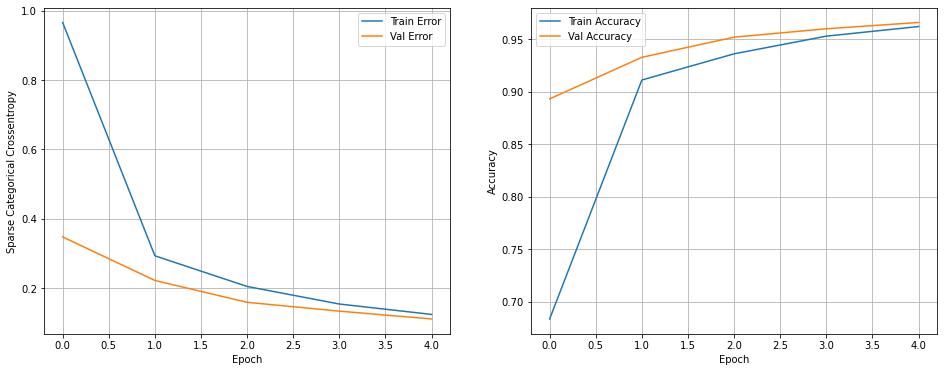

In [8]:
import pandas as pd
show_loss_accuracy_evolution(history)

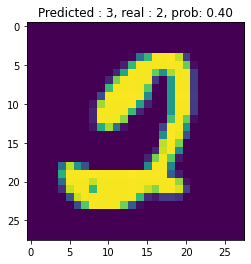

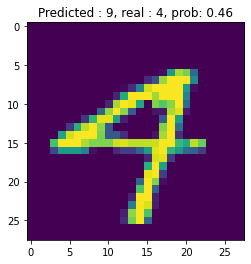

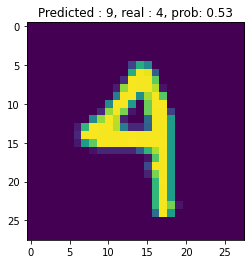

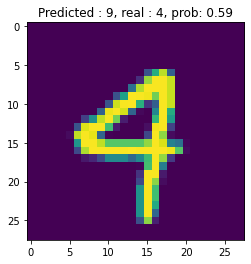

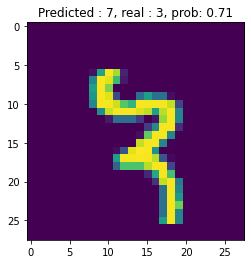

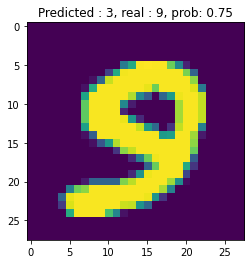

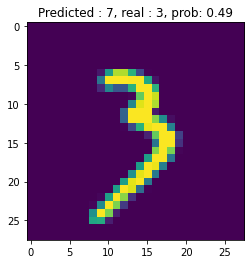

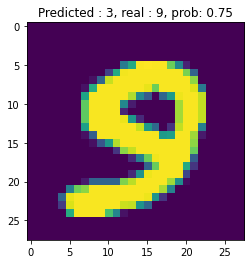

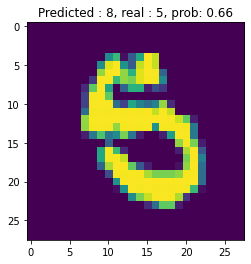

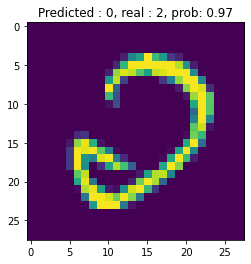

In [9]:
def show_errors(x_test, model, y_test, n_samples=10):
    labels = y_test.argmax(axis=-1).astype(np.int32)
    predictions = model.predict(x_test)
    preds = predictions.argmax(axis=-1).astype(np.int32)
    preds_prob = predictions.max(axis=-1)

    bad_pred_inds = np.where(preds != labels)[0]
    n_samples = min(len(bad_pred_inds), n_samples)
    samples_inds = np.random.choice(bad_pred_inds, n_samples)
    for ind in samples_inds:
        title = 'Predicted : {0}, real : {1}, prob: {2:.2f}'.format(
            int(preds[ind]), labels[ind], preds_prob[ind])
        plt.imshow(x_test[ind, :, :, 0])
        plt.title(title)
        plt.show()
        print()
    return


show_errors(x_test, model_old, y_test, n_samples=10)

### Improve the model

- **First conv layer**: 6 filters of 3x3, relu activation + Max Pooling
- **Second conv layer**: 16 filters of 3x3, relu activation + Max Pooling
- **Flatten layer**
- **Dense layer**: 120 units, relu activation
- **Dense layer**: 84 units, relu activation
- **Output layer**: 10 units (classes), softmax activation
Use relu instead sigmoids and MaxPooling2D, try any regularization

In [10]:
## relu and layers.MaxPooling2D

model = keras.Sequential()

model.add(layers.Conv2D(filters=6, kernel_size=(3, 3), activation='relu', input_shape=img_shape))
model.add(layers.MaxPooling2D())

model.add(layers.Dropout(0.3))

model.add(layers.Conv2D(filters=16, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPooling2D())

model.add(layers.Dropout(0.3))

model.add(layers.Flatten())

model.add(layers.Dense(units=120, activation='relu'))

model.add(layers.Dense(units=84, activation='relu'))

model.add(layers.Dense(units=10, activation = 'softmax'))

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
history = model.fit(x_train, y_train, batch_size=128 ,epochs=5, validation_split=0.2, verbose=1)

Epoch 1/5
375/375 [==============================] - 10s 27ms/step - loss: 1.0614 - accuracy: 0.6476 - val_loss: 0.1645 - val_accuracy: 0.9528
Epoch 2/5
375/375 [==============================] - 10s 26ms/step - loss: 0.2565 - accuracy: 0.9192 - val_loss: 0.1096 - val_accuracy: 0.9682
Epoch 3/5
375/375 [==============================] - 9s 24ms/step - loss: 0.1840 - accuracy: 0.9424 - val_loss: 0.0820 - val_accuracy: 0.9754
Epoch 4/5
375/375 [==============================] - 10s 27ms/step - loss: 0.1439 - accuracy: 0.9543 - val_loss: 0.0668 - val_accuracy: 0.9800
Epoch 5/5
375/375 [==============================] - 9s 24ms/step - loss: 0.1198 - accuracy: 0.9630 - val_loss: 0.0595 - val_accuracy: 0.9823


In [11]:
results = model.evaluate(x_test, y_test, verbose=1)
print('Test Loss: {}'.format(results[0]))
print('Test Accuracy: {}'.format(results[1]))

313/313 [==============================] - 1s 3ms/step - loss: 0.0560 - accuracy: 0.9835
Test Loss: 0.056043192744255066
Test Accuracy: 0.9835000038146973


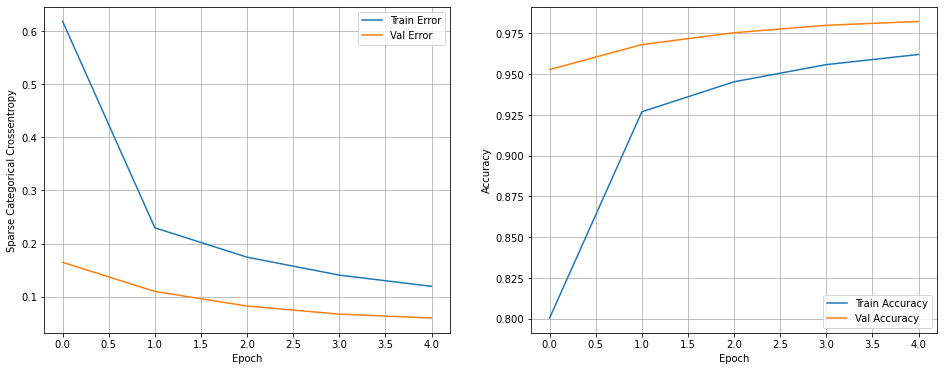

In [12]:
import pandas as pd
show_loss_accuracy_evolution(history)

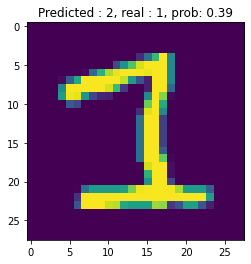

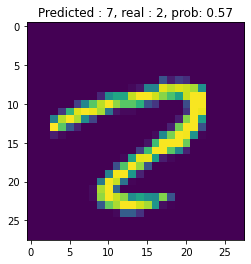

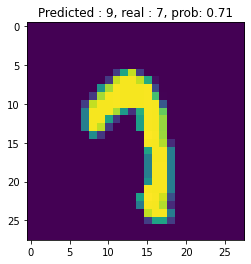

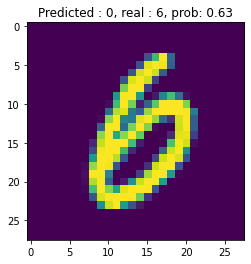

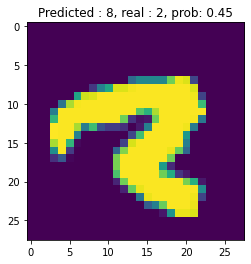

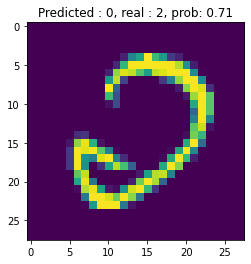

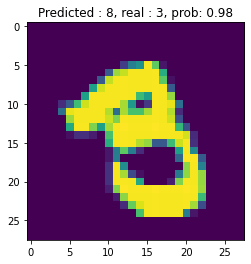

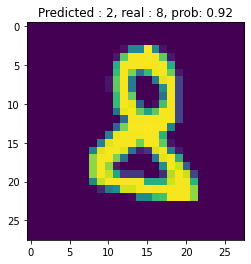

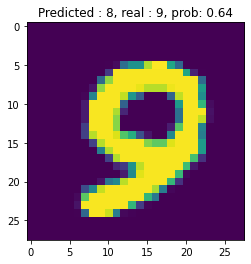

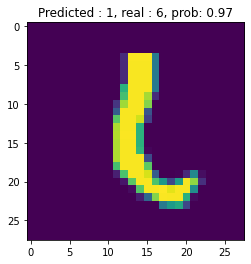

In [13]:
show_errors(x_test, model, y_test, n_samples=10)

#### Take a photo and predict


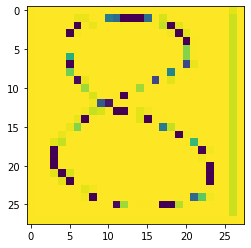

In [15]:
def read_image(image_path, target_size=None, grayscale=False):
    image = tf.keras.preprocessing.image.load_img(image_path,
                                                  target_size=target_size,
                                                  grayscale=grayscale)
    image = tf.keras.preprocessing.image.img_to_array(image)
    image = image.astype(np.uint8)
    return image


#img_path = '../images/digit.png'
url = 'https://i.ibb.co/3h7mLN1/digit.png'
image_path = tf.keras.utils.get_file("digit_8.png", url)
img = read_image(image_path, target_size=(28, 28), grayscale=True)

plt.imshow(np.squeeze(img))
plt.show()

In [17]:
x = np.expand_dims(img, 0)
x = x / 255.0
print(x.shape)
print('Old model character: {0} with probability: {1}'.format(model_old.predict(x).argmax(), model_old.predict(x).max()))
print('Improved model character: {0} with probability: {1}'.format(model.predict(x).argmax(), model.predict(x).max()))

(1, 28, 28, 1)
Old model character: 8 with probability: 0.5573023557662964
Improved model character: 8 with probability: 0.4882078468799591


# VGG-16

VGG16 is a convolutional neural network model proposed by K. Simonyan and A. Zisserman from the University of Oxford in the paper “Very Deep Convolutional Networks for Large-Scale Image Recognition”. The model achieves 92.7% top-5 test accuracy in ImageNet. VGG16 was trained for weeks and was using NVIDIA Titan Black GPU’s

<img src="https://i.ibb.co/QYfBNKm/vgg-16.png" alt="vgg-16" border="0">

In [18]:
model_VGG16 = tf.keras.applications.VGG16(
    include_top=False,
    weights="imagenet",
    classes=1000,
    input_shape=(256, 256, 3),
)
model_VGG16.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0     

In [19]:
# summarize filter shapes
for i, layer in enumerate(model_VGG16.layers):
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
    # get filter weights
    filters, biases = layer.get_weights()
    print(i, layer.name, filters.shape)

1 block1_conv1 (3, 3, 3, 64)
2 block1_conv2 (3, 3, 64, 64)
4 block2_conv1 (3, 3, 64, 128)
5 block2_conv2 (3, 3, 128, 128)
7 block3_conv1 (3, 3, 128, 256)
8 block3_conv2 (3, 3, 256, 256)
9 block3_conv3 (3, 3, 256, 256)
11 block4_conv1 (3, 3, 256, 512)
12 block4_conv2 (3, 3, 512, 512)
13 block4_conv3 (3, 3, 512, 512)
15 block5_conv1 (3, 3, 512, 512)
16 block5_conv2 (3, 3, 512, 512)
17 block5_conv3 (3, 3, 512, 512)


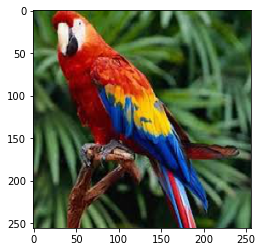

In [20]:
img_folder = '../../images'
url = 'https://i.ibb.co/q5TFmqh/bird.jpg'
#url = 'https://i.ibb.co/vd1SqSM/The-grandeur-of-the-Taj-Mahal-and-its-intricate-stone-inlays-immediately-greets-the-visitor-upon-ent.jpg'
image_path = tf.keras.utils.get_file("bird.jpg", url)
# image_path = '../../images/bird.jpeg'
image = read_image(image_path, target_size=(256, 256))
img = np.expand_dims(image, axis=0)
plt.imshow(image, cmap='viridis')

In [21]:
from tensorflow.keras.models import Model

# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = {layer.name: layer.output for layer in model_VGG16.layers}
# Set up a model that returns the activation values for every layer in
# VGG19 (as a dict).
feature_extractor = keras.Model(inputs=model_VGG16.inputs,
                                outputs=outputs_dict)

In [22]:
## Get the features of the image
features = feature_extractor(img)
print(features.keys())
#print(list(features.items())[0])

dict_keys(['input_1', 'block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_pool'])


feature_maps first hidden layer shape:  (1, 256, 256, 64)


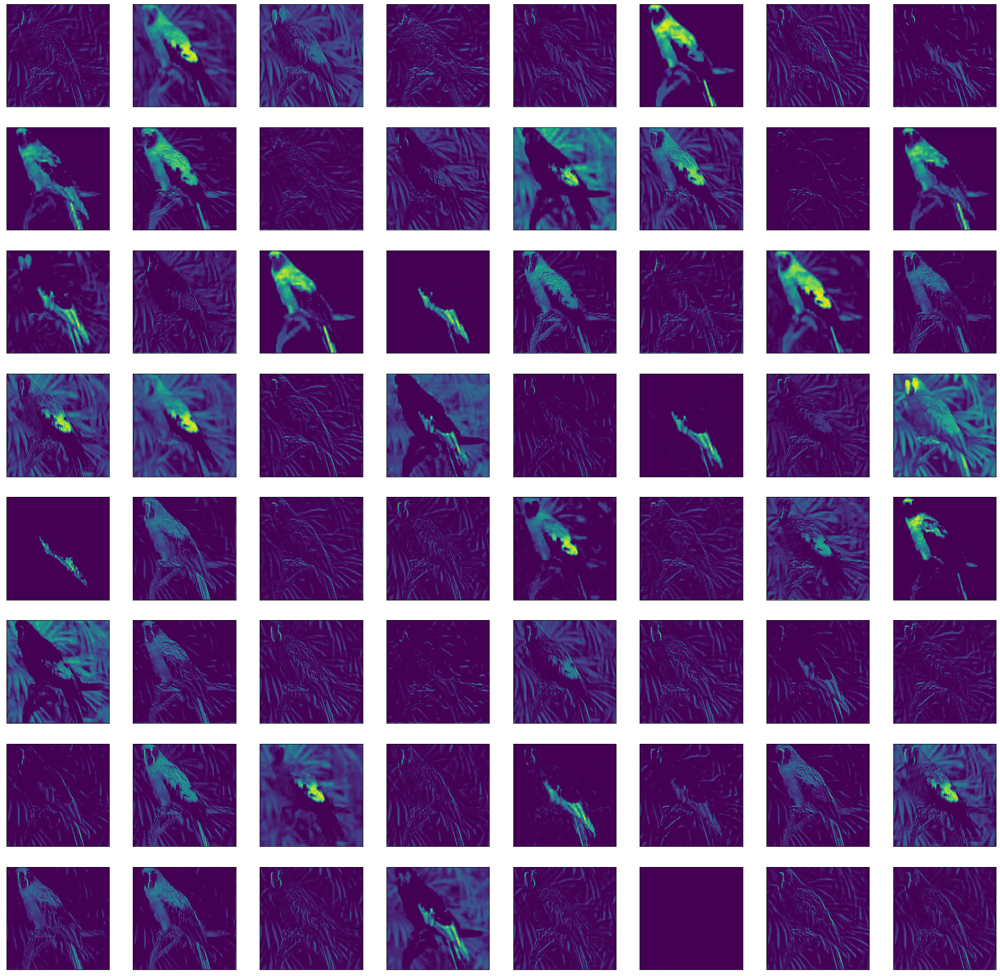

In [23]:
# get feature map for first hidden layer
feature_maps = features['block1_conv1']
print('feature_maps first hidden layer shape: ', feature_maps.shape)
# plot all 64 maps in an 8x8 squares
square = 8
ix = 1
plt.figure(figsize=(30, 30))
for _ in range(square):
    for _ in range(square):
        # specify subplot and turn of axis
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in viridis or gray
        plt.imshow(feature_maps[0, :, :, ix - 1], cmap='viridis')
        ix += 1
# show the figure
plt.show()

feature_maps shape:  (1, 64, 64, 256)


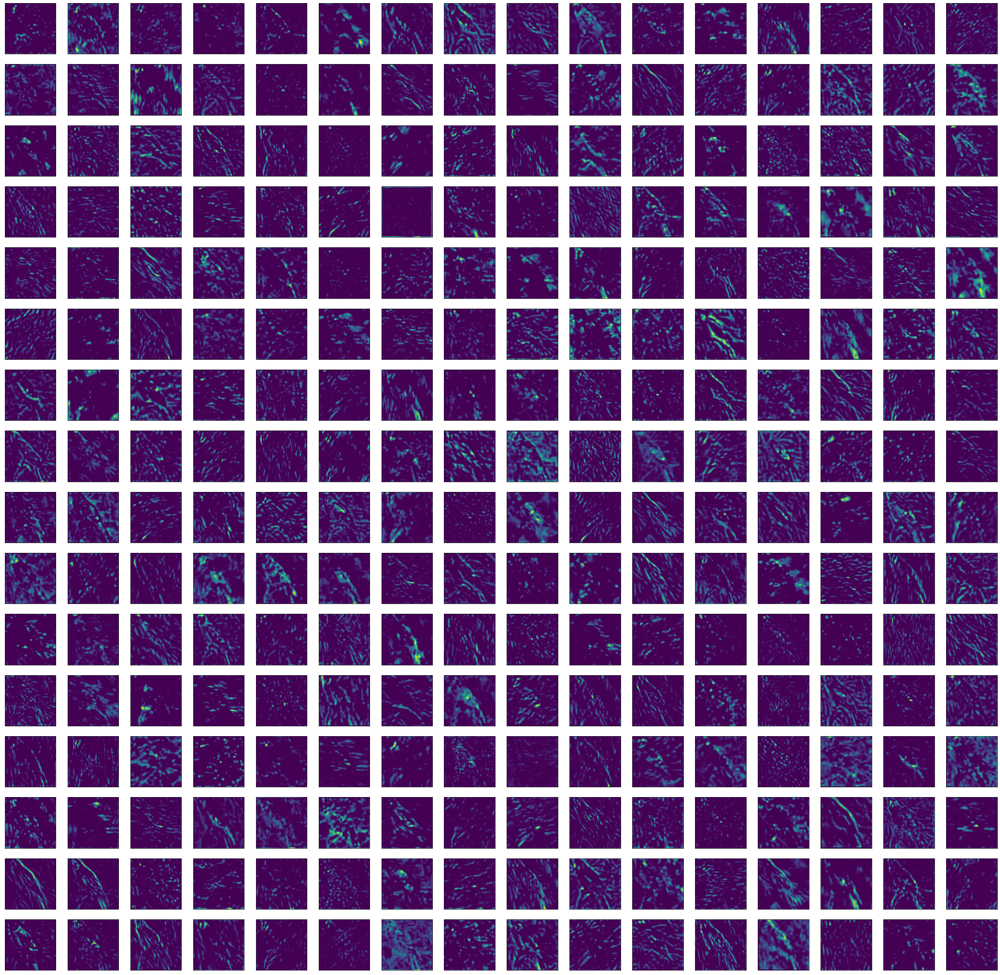

In [24]:
# block3_conv3
feature_maps = features['block3_conv3']
print('feature_maps shape: ', feature_maps.shape)

# plot all 256 maps in an 16x16 squares
square = 16
ix = 1
plt.figure(figsize=(40, 40))
for _ in range(square):
    for _ in range(square):
        # specify subplot and turn of axis
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        plt.imshow(feature_maps[0, :, :, ix - 1], cmap='viridis')
        ix += 1
# show the figure
plt.show()

In [25]:
features.keys()

dict_keys(['input_1', 'block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_pool'])

feature_maps shape:  (1, 256, 256, 64)


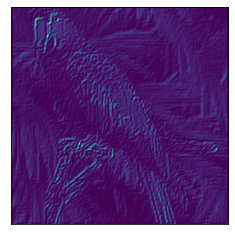

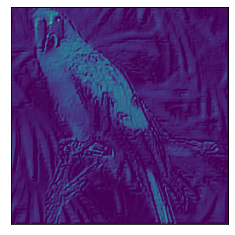

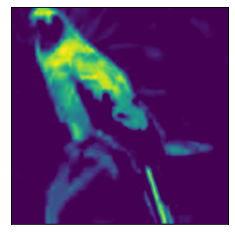

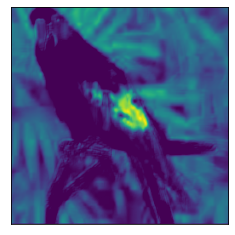

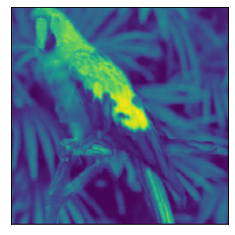

...

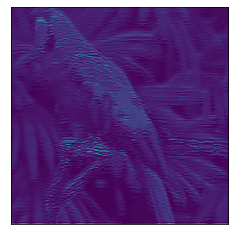

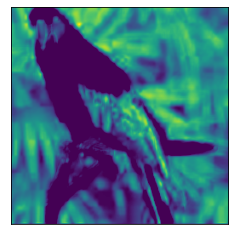

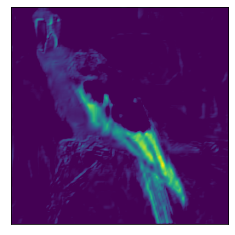

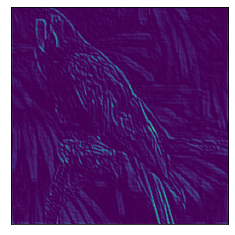

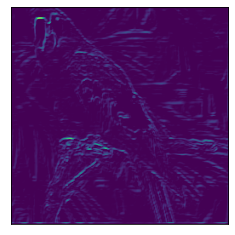

In [26]:
feature_maps = features['block1_conv2'] 
print('feature_maps shape: ', feature_maps.shape)
for i in range(feature_maps.shape[-1]):
    plt.xticks([])
    plt.yticks([])
    plt.imshow(feature_maps[0, :, :, i], cmap='viridis')
    plt.show()

feature_maps shape:  (1, 128, 128, 64)


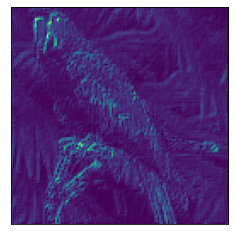

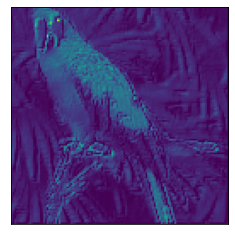

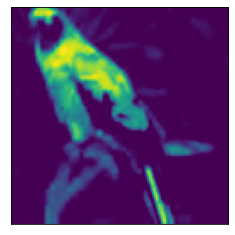

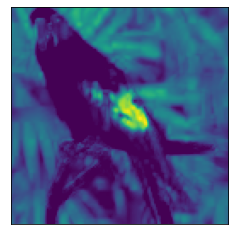

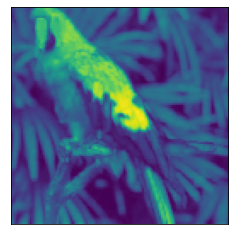

...

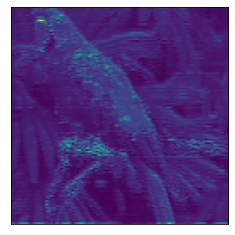

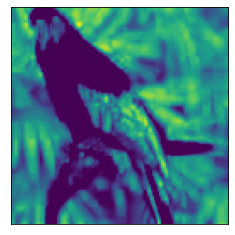

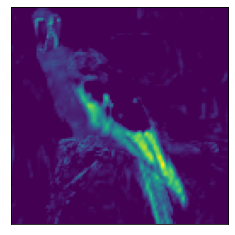

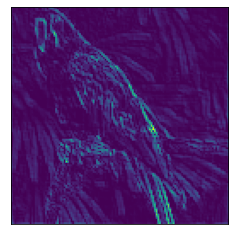

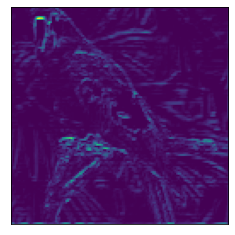

In [27]:
feature_maps = features['block1_pool'] 
print('feature_maps shape: ', feature_maps.shape)
for i in range(feature_maps.shape[-1]):
    plt.xticks([])
    plt.yticks([])
    plt.imshow(feature_maps[0, :, :, i], cmap='viridis')
    plt.show()